# Make a combined dataset with data from all stocks

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import os

In [ ]:
def load_and_preprocess(file_path, stock_id):
    df = pd.read_csv(file_path)
    df['timestamp'] = pd.to_datetime(df['timestamp'])
    df = df[df['timestamp'] >= pd.to_datetime('2014-11-02')]
    df['stock_id'] = stock_id
    df = compute_indicators(df)
    return df[['timestamp', 'volume', 'close', 'RSI', 'SMA20', 'MACD', 'stock_id']]

def compute_indicators(df):
    # Calculate RSI (14-day period)
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=14).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=14).mean()
    rs = gain / loss
    df['RSI'] = 100 - (100 / (1 + rs))

    # Calculate SMA20
    df['SMA20'] = df['close'].rolling(window=20).mean()

    # Calculate MACD
    exp12 = df['close'].ewm(span=12, adjust=False).mean()
    exp26 = df['close'].ewm(span=26, adjust=False).mean()
    df['MACD'] = exp12 - exp26

    # Forward fill NA values
    df.fillna(method='ffill', inplace=True)

    # If there are still NA values at the beginning, back fill them
    df.fillna(method='bfill', inplace=True)
    return df

# Process all CSV files
folder_path = '/content/drive/MyDrive/Personalized_Financial_Advisor_Project/Model_Creation/historic_price'
csv_files = [f for f in os.listdir(folder_path) if f.endswith('.csv')]
dataframes = []

for csv_file in csv_files:
    file_path = os.path.join(folder_path, csv_file)
    stock_name = os.path.splitext(csv_file)[0]  # Use filename without extension as stock_id
    print(f"Processing {stock_name}")
    df = load_and_preprocess(file_path, stock_name)
    dataframes.append(df)

# Combine all dataframes
combined_df = pd.concat(dataframes, ignore_index=True)

# Sort by timestamp and stock_id
combined_df = combined_df.sort_values(['timestamp', 'stock_id'])

# Save the combined dataset
combined_df.to_csv('combined_stocks_dataset.csv', index=False)

Processing WMT


<ipython-input-3-7df2a8762197>:26: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)
<ipython-input-3-7df2a8762197>:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='bfill', inplace=True)


Processing WBA


<ipython-input-3-7df2a8762197>:26: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)
<ipython-input-3-7df2a8762197>:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='bfill', inplace=True)


Processing VZ


<ipython-input-3-7df2a8762197>:26: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)
<ipython-input-3-7df2a8762197>:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='bfill', inplace=True)


Processing V


<ipython-input-3-7df2a8762197>:26: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)
<ipython-input-3-7df2a8762197>:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='bfill', inplace=True)


Processing UNH


<ipython-input-3-7df2a8762197>:26: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)
<ipython-input-3-7df2a8762197>:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='bfill', inplace=True)


Processing TRV


<ipython-input-3-7df2a8762197>:26: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)
<ipython-input-3-7df2a8762197>:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='bfill', inplace=True)


Processing PG


<ipython-input-3-7df2a8762197>:26: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)
<ipython-input-3-7df2a8762197>:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='bfill', inplace=True)


Processing MSFT


<ipython-input-3-7df2a8762197>:26: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)
<ipython-input-3-7df2a8762197>:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='bfill', inplace=True)


Processing MRK


<ipython-input-3-7df2a8762197>:26: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)
<ipython-input-3-7df2a8762197>:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='bfill', inplace=True)


Processing MMM


<ipython-input-3-7df2a8762197>:26: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)
<ipython-input-3-7df2a8762197>:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='bfill', inplace=True)


Processing MCD


<ipython-input-3-7df2a8762197>:26: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)
<ipython-input-3-7df2a8762197>:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='bfill', inplace=True)


Processing KO


<ipython-input-3-7df2a8762197>:26: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)
<ipython-input-3-7df2a8762197>:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='bfill', inplace=True)


Processing JPM


<ipython-input-3-7df2a8762197>:26: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)
<ipython-input-3-7df2a8762197>:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='bfill', inplace=True)


Processing INTC


<ipython-input-3-7df2a8762197>:26: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)
<ipython-input-3-7df2a8762197>:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='bfill', inplace=True)


Processing IBM


<ipython-input-3-7df2a8762197>:26: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)
<ipython-input-3-7df2a8762197>:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='bfill', inplace=True)


Processing HON


<ipython-input-3-7df2a8762197>:26: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)
<ipython-input-3-7df2a8762197>:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='bfill', inplace=True)


Processing HD


<ipython-input-3-7df2a8762197>:26: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)
<ipython-input-3-7df2a8762197>:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='bfill', inplace=True)


Processing GS


<ipython-input-3-7df2a8762197>:26: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)
<ipython-input-3-7df2a8762197>:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='bfill', inplace=True)


Processing CVX


<ipython-input-3-7df2a8762197>:26: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)
<ipython-input-3-7df2a8762197>:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='bfill', inplace=True)


Processing CSCO


<ipython-input-3-7df2a8762197>:26: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)
<ipython-input-3-7df2a8762197>:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='bfill', inplace=True)


In [ ]:
# Count the number of values for each 'stock_id'
value_counts = combined_df['stock_id'].value_counts()
value_counts

,count
stock_id,
CSCO,2505
CVX,2505
GS,2505
HD,2505
HON,2505
IBM,2505
INTC,2505
JPM,2505
KO,2505


In [ ]:
# Save the combined dataset to a specified directory within your Google Drive.
output_dir = '/content/drive/MyDrive/Personalized_Financial_Advisor_Project/Model_Creation/processed_data'  # Replace with your desired directory

# Create the output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

# Construct the full output file path
output_file_path = os.path.join(output_dir, 'combined_stocks_dataset.csv')

# Save the combined dataset to the specified directory
combined_df.to_csv(output_file_path, index=False)

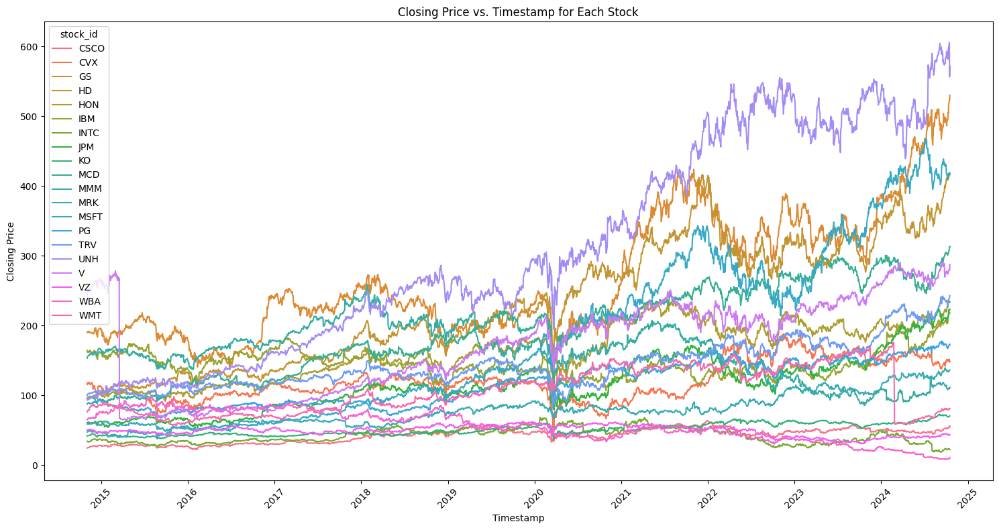

In [ ]:
# prompt: plot closing price vs timestamp of each stock

import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'combined_df' is your DataFrame
# Create the plot
plt.figure(figsize=(15, 8))
sns.lineplot(x='timestamp', y='close', hue='stock_id', data=combined_df)
plt.title('Closing Price vs. Timestamp for Each Stock')
plt.xlabel('Timestamp')
plt.ylabel('Closing Price')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

# Loading Dataset

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Personalized_Financial_Advisor_Project/Model_Creation/processed_data/combined_stocks_dataset.csv')

In [ ]:
from sklearn.preprocessing import LabelEncoder
# Sort the dataframe by stock_id and timestamp
df = df.sort_values(['stock_id', 'timestamp'])

# Encode stock_id as integers
le = LabelEncoder()
df['stock_id_encoded'] = le.fit_transform(df['stock_id'])

In [ ]:
df.head()

,timestamp,volume,close,RSI,SMA20,MACD,stock_id,stock_id_encoded
0,2014-11-03,16383403,24.58,8.181818,26.14575,-0.675146,CSCO,0
20,2014-11-04,24620912,24.88,8.653846,26.30775,-0.640149,CSCO,0
40,2014-11-05,21979615,25.15,8.720930,26.46125,-0.616713,CSCO,0
60,2014-11-06,18373704,25.26,8.604207,26.59225,-0.605322,CSCO,0
80,2014-11-07,34001930,25.33,8.152174,26.70425,-0.593178,CSCO,0


# Creating training dataset

In [ ]:
# Function to create sequences
def create_sequences(group, seq_length=60):
    sequences = []
    targets = []
    stock_ids = []

    for i in range(len(group) - seq_length):
        seq = group.iloc[i:i+seq_length][['close', 'RSI', 'SMA20', 'MACD']].values
        target = group.iloc[i+seq_length]['close']
        stock_id = group.iloc[i]['stock_id_encoded']

        sequences.append(seq)
        targets.append(target)
        stock_ids.append(stock_id)

    return np.array(sequences), np.array(targets), np.array(stock_ids)

# Create sequences for each stock
X_price_list = []
y_list = []
X_stock_list = []

for stock_id, group in df.groupby('stock_id'):
    print(f"Processing stock ID: {stock_id}")
    X_price, y, X_stock = create_sequences(group)
    X_price_list.append(X_price)
    y_list.append(y)
    X_stock_list.append(X_stock)

# Combine sequences from all stocks
X_price = np.concatenate(X_price_list)
y = np.concatenate(y_list)
X_stock = np.concatenate(X_stock_list)

# Reshape X_stock to match the required shape
X_stock = X_stock.reshape(-1, 1)

# Verify shapes
print("X_price shape:", X_price.shape)
print("X_stock shape:", X_stock.shape)
print("y shape:", y.shape)

Processing stock ID: CSCO
Processing stock ID: CVX
Processing stock ID: GS
Processing stock ID: HD
Processing stock ID: HON
Processing stock ID: IBM
Processing stock ID: INTC
Processing stock ID: JPM
Processing stock ID: KO
Processing stock ID: MCD
Processing stock ID: MMM
Processing stock ID: MRK
Processing stock ID: MSFT
Processing stock ID: PG
Processing stock ID: TRV
Processing stock ID: UNH
Processing stock ID: V
Processing stock ID: VZ
Processing stock ID: WBA
Processing stock ID: WMT
X_price shape: (48900, 60, 4)
X_stock shape: (48900, 1)
y shape: (48900,)


# Making model

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Embedding, LSTM, Dense, Concatenate, Flatten
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import numpy as np

# Normalize the X_price data
scaler = MinMaxScaler()
X_price_normalized = scaler.fit_transform(X_price.reshape(-1, 4)).reshape(X_price.shape)

# Split into training, validation, and testing sets
X_price_train, X_price_test, X_stock_train, X_stock_test, y_train, y_test = train_test_split(
    X_price_normalized, X_stock, y, test_size=0.2, random_state=42)

Baseline model

In [ ]:
# Define the model
# Input for sequential data
price_input = Input(shape=(60, 4), name="price_input")
lstm_out = LSTM(64, return_sequences=True)(price_input)
lstm_out = LSTM(32)(lstm_out)

# Input for stock ID
stock_input = Input(shape=(1,), name="stock_input")
embedding = Embedding(input_dim=len(np.unique(X_stock)), output_dim=10)(stock_input)
embedding_flat = Flatten()(embedding)

# Concatenate the outputs
merged = Concatenate()([lstm_out, embedding_flat])

# Fully connected layers
dense1 = Dense(64, activation="relu")(merged)
dense2 = Dense(32, activation="relu")(dense1)
output = Dense(1, activation="linear")(dense2)

# Create the model
model = Model(inputs=[price_input, stock_input], outputs=output)

# Compile the model
model.compile(optimizer="adam", loss="mse", metrics=["mae"])
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ price_input (InputLayer)  │ (None, 60, 4)          │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stock_input (InputLayer)  │ (None, 1)              │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm (LSTM)               │ (None, 60, 64)         │         17,664 │ price_input[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ embedding_1 (Embedding)   │ (None, 1, 10)          │            230 │ stock_input[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_1 (LSTM)             │ (None, 32)             │         12,416 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_1 (Flatten)       │ (None, 10)             │              0 │ embedding_1[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_1             │ (None, 42)             │              0 │ lstm_1[0][0],          │
│ (Concatenate)             │                        │                │ flatten_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_3 (Dense)           │ (None, 64)             │          2,752 │ concatenate_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_4 (Dense)           │ (None, 32)             │          2,080 │ dense_3[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_5 (Dense)           │ (None, 1)              │             33 │ dense_4[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 35,175 (137.40 KB)

 Trainable params: 35,175 (137.40 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Train the model
history = model.fit(
    [X_price_train, X_stock_train],
    y_train,
    validation_split=0.2,
    epochs=25,
    batch_size=32,
    verbose=1,
)

# Evaluate the model
test_loss, test_mae = model.evaluate([X_price_test, X_stock_test], y_test)
print(f"Test MAE: {test_mae}")

Epoch 1/25
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 17s 11ms/step - loss: 10178.9229 - mae: 69.1766 - val_loss: 3269.0127 - val_mae: 37.8812
Epoch 2/25
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 17s 10ms/step - loss: 1435.5063 - mae: 21.2846 - val_loss: 17.6917 - val_mae: 2.6836
Epoch 3/25
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 22s 11ms/step - loss: 15.3361 - mae: 2.5697 - val_loss: 12.1963 - val_mae: 2.0698
Epoch 4/25
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 12s 11ms/step - loss: 12.1513 - mae: 2.2792 - val_loss: 13.8125 - val_mae: 2.4019
Epoch 5/25
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 12s 11ms/step - loss: 11.4747 - mae: 2.2174 - val_loss: 16.1488 - val_mae: 2.7498
Epoch 6/25
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 21s 11ms/step - loss: 9.6200 - mae: 2.0382 - val_loss: 7.1000 - val_mae: 1.6193
Epoch 7/25
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 12s 11ms/step - loss: 7.7223 - mae: 1.8671 - val_loss: 8.7884 - val_mae: 1.9819
Epoch 8/25
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 21s 11ms/step - loss: 10.7036 - mae: 2.0635 - val_loss: 7.8831 - val_mae: 1.6479
Epo

In [ ]:
# Make predictions
predictions = model.predict([X_price_test, X_stock_test])

352/352 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step


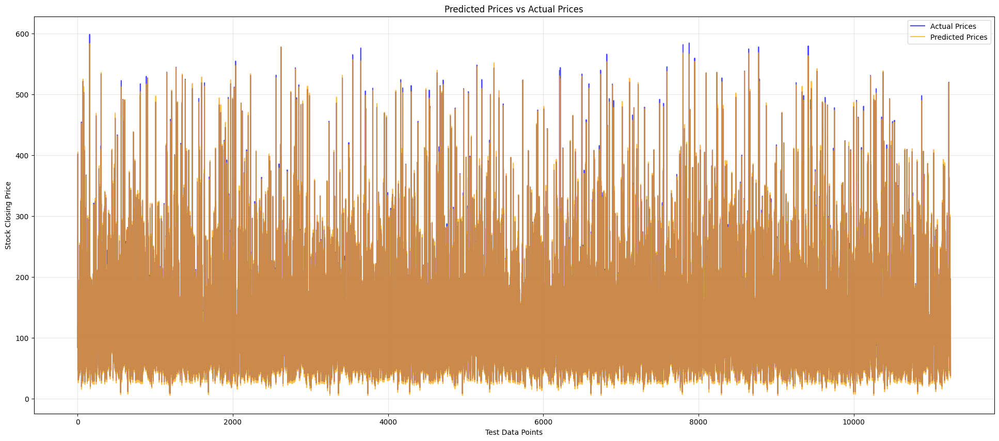

In [ ]:
import matplotlib.pyplot as plt

# Plot predicted vs actual prices for test data
plt.figure(figsize=(24, 10))
plt.plot(y_test, label="Actual Prices", color="blue", alpha=0.7)
plt.plot(predictions, label="Predicted Prices", color="orange", alpha=0.7)
plt.title("Predicted Prices vs Actual Prices")
plt.xlabel("Test Data Points")
plt.ylabel("Stock Closing Price")
plt.legend()
plt.grid(alpha=0.3)
plt.show()


Hyperparam tuning

In [ ]:
pip install keras-tuner --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 4.3 MB/s eta 0:00:00


In [ ]:
import tensorflow as tf
import keras_tuner as kt

def build_model(hp):
    price_input = tf.keras.layers.Input(shape=(60, 4), name="price_input")
    stock_input = tf.keras.layers.Input(shape=(1,), name="stock_input")

    # Tune the number of LSTM units
    lstm_units_1 = hp.Int('lstm_units_1', min_value=32, max_value=128, step=32)
    lstm_units_2 = hp.Int('lstm_units_2', min_value=16, max_value=64, step=16)

    x = tf.keras.layers.LSTM(lstm_units_1, return_sequences=True)(price_input)
    x = tf.keras.layers.LSTM(lstm_units_2)(x)

    # Tune the embedding dimension
    embedding_dim = hp.Int('embedding_dim', min_value=5, max_value=20, step=5)
    y = tf.keras.layers.Embedding(input_dim=24, output_dim=embedding_dim)(stock_input)
    y = tf.keras.layers.Flatten()(y)

    merged = tf.keras.layers.Concatenate()([x, y])

    # Tune the number of dense layers and their units
    for i in range(hp.Int('num_dense_layers', 1, 3)):
        merged = tf.keras.layers.Dense(
            units=hp.Int(f'dense_units_{i}', min_value=16, max_value=128, step=16),
            activation='relu'
        )(merged)

    output = tf.keras.layers.Dense(1)(merged)

    model = tf.keras.Model(inputs=[price_input, stock_input], outputs=output)

    # Tune the learning rate
    learning_rate = hp.Float('learning_rate', min_value=1e-4, max_value=1e-2, sampling='log')
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
                  loss='mse',
                  metrics=['mae'])

    return model

# Create a tuner
tuner = kt.Hyperband(
    build_model,
    objective='val_loss',
    max_epochs=30,
    factor=3,
    directory='my_dir',
    project_name='stock_price_prediction'
)

# Perform the search
tuner.search(
    [X_price_train, X_stock_train],
    y_train,
    epochs=30,
    validation_split=0.2,
    callbacks=[tf.keras.callbacks.EarlyStopping(patience=5)]
)

# Get the best model
best_model = tuner.get_best_models(num_models=1)[0]

# Print the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print("Best hyperparameters:")
for param, value in best_hps.values.items():
    print(f"{param}: {value}")

Trial 85 Complete [00h 03m 40s]
val_loss: 6.605989933013916

Best val_loss So Far: 5.091289043426514
Total elapsed time: 01h 51m 30s

Search: Running Trial #86

Value             |Best Value So Far |Hyperparameter
64                |32                |lstm_units_1
64                |48                |lstm_units_2
10                |20                |embedding_dim
2                 |1                 |num_dense_layers
112               |96                |dense_units_0
0.00059375        |0.0023904         |learning_rate
48                |112               |dense_units_1
32                |16                |dense_units_2
30                |30                |tuner/epochs
0                 |10                |tuner/initial_epoch
0                 |2                 |tuner/bracket
0                 |2                 |tuner/round

Epoch 1/30
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 15s 11ms/step - loss: 10003.5156 - mae: 69.4919 - val_loss: 39.3667 - val_mae: 3.6646
Epoch 2/30
1125/1125 ━━━━━━━━

LSTM_Model 2

In [ ]:
# Define the model
# Input for sequential data
price_input = Input(shape=(60, 4), name="price_input")
lstm_out = LSTM(32, return_sequences=True)(price_input)
lstm_out = LSTM(48)(lstm_out)

# Input for stock ID
stock_input = Input(shape=(1,), name="stock_input")
embedding = Embedding(input_dim=len(np.unique(X_stock)), output_dim=20)(stock_input)
embedding_flat = Flatten()(embedding)

# Concatenate the outputs
merged = Concatenate()([lstm_out, embedding_flat])

# Fully connected layers
dense1 = Dense(64, activation="relu")(merged)
dense2 = Dense(32, activation="relu")(dense1)
output = Dense(1, activation="linear")(dense2)

# Create the model
model = Model(inputs=[price_input, stock_input], outputs=output)

# Compile the model
model.compile(optimizer="adam", loss="mse", metrics=["mae"])
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ price_input (InputLayer)  │ (None, 60, 4)          │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stock_input (InputLayer)  │ (None, 1)              │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm (LSTM)               │ (None, 60, 32)         │          4,736 │ price_input[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ embedding (Embedding)     │ (None, 1, 20)          │            460 │ stock_input[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_1 (LSTM)             │ (None, 48)             │         15,552 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten (Flatten)         │ (None, 20)             │              0 │ embedding[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 68)             │              0 │ lstm_1[0][0],          │
│                           │                        │                │ flatten[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 64)             │          4,416 │ concatenate[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 32)             │          2,080 │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 1)              │             33 │ dense_1[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 27,277 (106.55 KB)

 Trainable params: 27,277 (106.55 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Train the model
history = model.fit(
    [X_price_train, X_stock_train],
    y_train,
    validation_split=0.2,
    epochs=25,
    batch_size=32,
    verbose=1,
)

# Evaluate the model
test_loss, test_mae = model.evaluate([X_price_test, X_stock_test], y_test)
print(f"Test MAE: {test_mae}")

Epoch 1/25
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 71s 60ms/step - loss: 8388.1523 - mae: 61.3599 - val_loss: 40.7862 - val_mae: 3.4555
Epoch 2/25
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 67s 59ms/step - loss: 27.7945 - mae: 3.3498 - val_loss: 13.3542 - val_mae: 2.2006
Epoch 3/25
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 78s 56ms/step - loss: 14.2612 - mae: 2.5681 - val_loss: 37.0039 - val_mae: 5.0847
Epoch 4/25
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 63s 56ms/step - loss: 13.6143 - mae: 2.4246 - val_loss: 9.5160 - val_mae: 1.7199
Epoch 5/25
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 80s 54ms/step - loss: 11.0055 - mae: 2.1839 - val_loss: 13.6067 - val_mae: 2.2868
Epoch 6/25
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 82s 54ms/step - loss: 10.2427 - mae: 2.1455 - val_loss: 9.2510 - val_mae: 1.7925
Epoch 7/25
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 89s 61ms/step - loss: 10.1967 - mae: 2.0919 - val_loss: 10.7990 - val_mae: 2.2552
Epoch 8/25
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 84s 62ms/step - loss: 8.2209 - mae: 1.8588 - val_loss: 6.0359 - val_mae: 1.5013
Epoch 9/2

In [ ]:
# Make predictions
predictions = model.predict([X_price_test, X_stock_test])

352/352 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step


# Ploting predicted and actual price of testing set for each stock in testing set

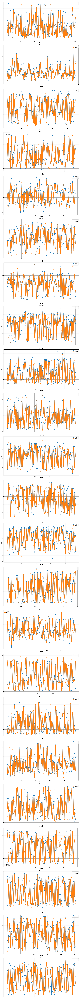

In [ ]:
# prompt: plot predicted and actual price of testing set for each stock in testing set

# Assuming 'predictions' and 'y_test' are already defined from your model's predictions
# and the actual test values, respectively. Also assuming X_stock_test contains the encoded stock IDs.

import matplotlib.pyplot as plt

# Decode the stock IDs back to original labels
decoded_stock_ids = le.inverse_transform(X_stock_test.astype(int).flatten())

# Create a dictionary to store predictions and actual prices for each stock
stock_predictions = {}
stock_actual = {}
for i in range(len(decoded_stock_ids)):
    stock_id = decoded_stock_ids[i]
    if stock_id not in stock_predictions:
        stock_predictions[stock_id] = []
        stock_actual[stock_id] = []
    stock_predictions[stock_id].append(predictions[i][0])
    stock_actual[stock_id].append(y_test[i])

# Plot for each stock
plt.figure(figsize=(15, 8 * len(stock_predictions)))  # Adjust figure size based on the number of stocks

for i, (stock_id, pred_prices) in enumerate(stock_predictions.items()):
    plt.subplot(len(stock_predictions), 1, i + 1)
    plt.plot(stock_actual[stock_id], label="Actual", marker='o')
    plt.plot(pred_prices, label="Predicted", marker='x')
    plt.title(f"Stock: {stock_id}")
    plt.xlabel("Time steps")  # Or 'Test data points'
    plt.ylabel("Price")
    plt.legend()
    plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
# prompt: calc mae for each stock in testing set

from sklearn.metrics import mean_absolute_error

# Calculate MAE for each stock
mae_per_stock = {}
for stock_id, pred_prices in stock_predictions.items():
  mae = mean_absolute_error(stock_actual[stock_id], pred_prices)
  mae_per_stock[stock_id] = mae

# Print MAE for each stock
for stock_id, mae in mae_per_stock.items():
    print(f"MAE for {stock_id}: {mae}")

MAE for MRK: 1.6185686276879645
MAE for IBM: 1.480112576166789
MAE for HON: 1.5339657979240588
MAE for GS: 3.718842537213569
MAE for INTC: 3.8271794748795838
MAE for JNJ: 1.1056481093067236
MAE for MMM: 1.7199845980034498
MAE for CSCO: 3.7472581530664257
MAE for KO: 3.151202409496866
MAE for JPM: 1.4828833322773478
MAE for DOW: 3.683142616709725
MAE for WBA: 2.7548810096014114
MAE for VZ: 3.4948341039401383
MAE for CRM: 2.479347774811105
MAE for CVX: 1.3238794159054292
MAE for UNH: 4.042418084825788
MAE for MSFT: 2.510235340663364
MAE for TRV: 1.3547340742746992
MAE for HD: 2.8384929410973365
MAE for V: 2.258377285747802
MAE for PG: 1.0844687613995625
MAE for MCD: 2.0680787247993155
MAE for WMT: 1.6434605303955083


# Tasks



1.   Prediction pipeline
2.   Plot graph of predicted price vs actual price for the entire data of each stock like:
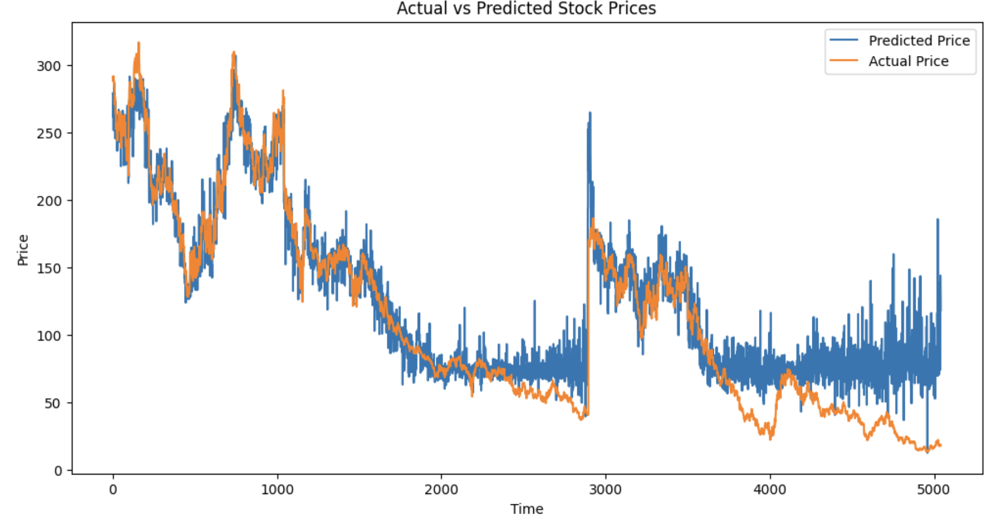
2.   interface for prediction
3.   Slides



## Prediction pipeline
1.  user input stock name and prediction timeframe
2.  get last 60 days stock price and tech indicators from alpha venture API and make that into df
3.  get label encoding of that stock.
4.  normalise the df using min-max scaler
5.  feed the df and stock_id to the model
6.  get predictions
7.  if timeframe is more than 1 day then implement a rolling prediction function.
8.  show result.